# Graphs and Dataframes

## Datasets

In [1]:
import numpy as np
from pathlib import Path
import networkx as nx
from statsmodels.distributions.empirical_distribution import ECDF
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import warnings
import math
warnings.filterwarnings('ignore')

def find_neighbors(G, node):
    successors = set(G.successors(node))
    predecessors = set(G.predecessors(node))
    neighbors = successors | predecessors
    return len(neighbors)

def read_net_file(file_path):
    with open(file_path, 'r') as file:
        lines = file.readlines()

    nodes = {}
    n_states = 0
    create = True
    
    for line in lines:
        if line.strip() and not line.startswith('*'):  # Ignora le righe vuote e i commenti
            parts = line.strip().split()
            if len(parts) == 5:
                nodes[int(parts[0])-1] = [parts[1].replace('"', ''), float(parts[2]), float(parts[3])]
                n_states += 1
            elif len(parts) == 3:
                if create:
                    matrix = [[0 for _ in range(n_states)] for _ in range(n_states)]
                    create = False
                matrix[int(parts[0])-1][int(parts[1])-1] = float(parts[2])

    return nodes, matrix

In [2]:
dataset_folder = Path.cwd().joinpath("datasets")
data2015 = dataset_folder.joinpath("2015.net")

nodes, m2015 = read_net_file(data2015)

In [3]:
G2015 = nx.DiGraph()

for r in range(len(m2015)):
  for c in range(len(m2015[r])):
    if m2015[r][c]>0:
      G2015.add_edge(nodes[r][0], nodes[c][0], price=m2015[r][c])

print(G2015)

DiGraph with 161 nodes and 18061 edges


## Binary graph

In [4]:
Tot2015 = {'Imp':[sum(i) for i in m2015], 'Exp':[sum([m2015[j][i] for j in range(len(m2015))]) for i in range(len(m2015))], 'ImpPartners':[sum(1 for e in i if e > 0) for i in m2015], 'ExpPartners':[sum([1 for j in range(len(m2015)) if m2015[j][i] > 0]) for i in range(len(m2015))]}

threshold = 0.1

G2015bin = nx.DiGraph()


for r in range(len(m2015)):
  for c in range(len(m2015[r])):
    if (m2015[r][c]>0) and ((m2015[r][c]>threshold*Tot2015['Imp'][r])) and ((m2015[r][c]>threshold*Tot2015['Exp'][c])):
      G2015bin.add_edge(nodes[r][0], nodes[c][0], importance='both', price=m2015[r][c])
    elif (m2015[r][c]>0) and ((m2015[r][c]>threshold*Tot2015['Imp'][r])):
      G2015bin.add_edge(nodes[r][0], nodes[c][0], importance='import', price=m2015[r][c])
    elif (m2015[r][c]>0) and ((m2015[r][c]>threshold*Tot2015['Exp'][c])):
      G2015bin.add_edge(nodes[r][0], nodes[c][0], importance='export', price=m2015[r][c])

print(G2015bin)

DiGraph with 161 nodes and 609 edges


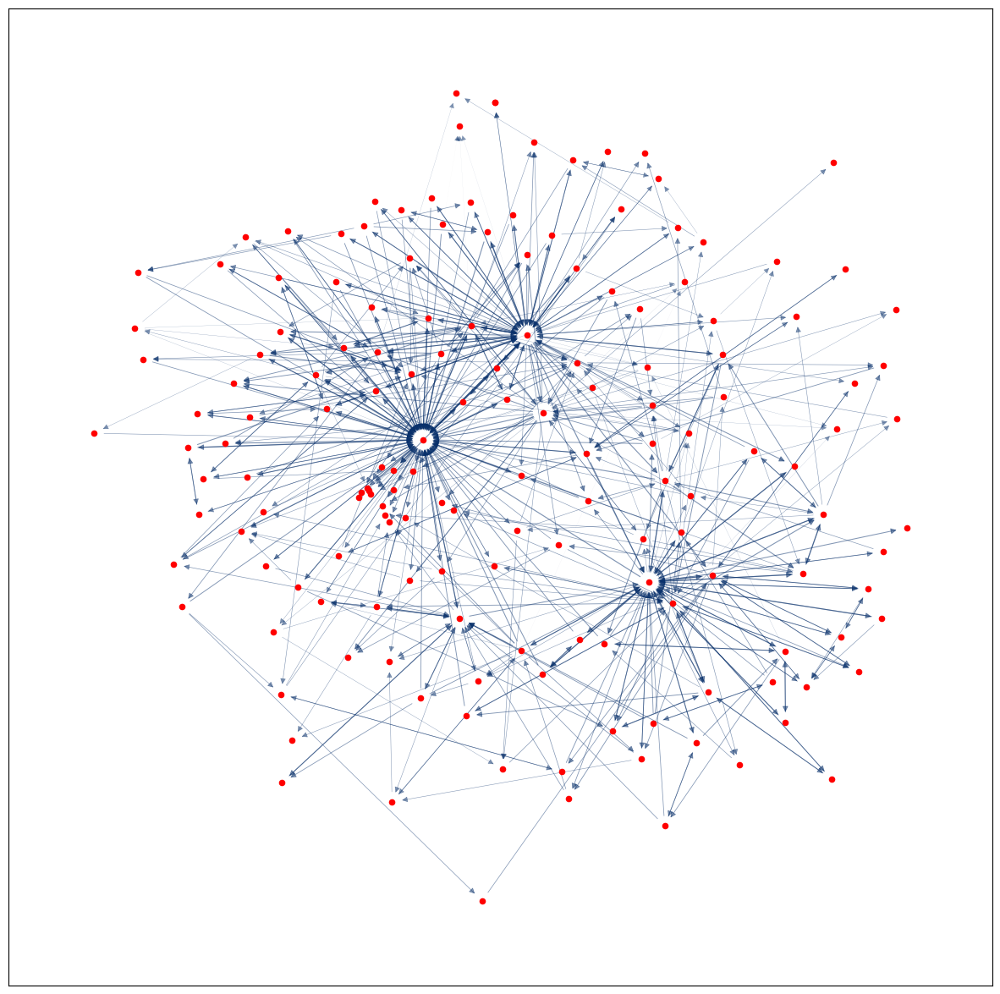

In [5]:
prices = nx.get_edge_attributes(G2015bin, 'price').values()
prices = [math.log(i) for i in list(prices)]
max_price = max(prices)
min_price = min(prices)
norm_prices = [(price - min_price) / (max_price - min_price) for price in prices]

edges = G2015bin.edges(data=True)
edge_colors = [attr['price'] for _, _, attr in edges]

# draw the graph
pos = nx.kamada_kawai_layout(G2015bin)
plt.figure(figsize=(15,15))
nx.draw_networkx_nodes(G2015bin, pos, node_size=20, node_color='red', label=True)
#nx.draw_networkx_edges(G2015lite, pos, alpha=0.5)
nx.draw_networkx_edges(G2015bin, pos, alpha=0.5, edge_color=edge_colors, edge_cmap=plt.cm.Blues, edge_vmin=min_price, edge_vmax=max_price, width=norm_prices)

plt.savefig("network.png")
plt.show()

In [6]:
G2015.edges.data('price')

OutEdgeDataView([('AGO', 'ALB', 331.768), ('AGO', 'ARE', 510063.0), ('AGO', 'ARG', 128594.0), ('AGO', 'ARM', 1.631), ('AGO', 'ATG', 6989.07), ('AGO', 'AUS', 11717.0), ('AGO', 'AUT', 30271.0), ('AGO', 'AZE', 87.518), ('AGO', 'BDI', 1.839), ('AGO', 'BEL', 836612.0), ('AGO', 'BEN', 712.868), ('AGO', 'BFA', 83.942), ('AGO', 'BGD', 4127.94), ('AGO', 'BGR', 2127.16), ('AGO', 'BHR', 718.261), ('AGO', 'BHS', 456.032), ('AGO', 'BIH', 1101.26), ('AGO', 'BLR', 589.447), ('AGO', 'BOL', 158.988), ('AGO', 'BRA', 874844.0), ('AGO', 'BRN', 5.309), ('AGO', 'BTN', 0.113), ('AGO', 'BWA', 1028.58), ('AGO', 'CAN', 79095.4), ('AGO', 'CHE', 53545.6), ('AGO', 'CHL', 2768.82), ('AGO', 'CHN', 3300000.0), ('AGO', 'CIV', 79606.8), ('AGO', 'CMR', 2054.8), ('AGO', 'COG', 11142.4), ('AGO', 'COL', 8399.61), ('AGO', 'CRI', 36.015), ('AGO', 'CYP', 3011.28), ('AGO', 'CZE', 1935.04), ('AGO', 'DEU', 301879.0), ('AGO', 'DMA', 5.484), ('AGO', 'DNK', 26489.8), ('AGO', 'DOM', 211.284), ('AGO', 'DZA', 1296.65), ('AGO', 'ECU', 

## Df creation

In [7]:
gdp_df = pd.read_csv('datasets/GDP.csv')
gdp2015 = gdp_df[gdp_df['Year']==2015][['Code', 'GDP (constant 2015 US$)']]

node_in =  pd.DataFrame.from_dict(dict(G2015.in_degree()),orient="index", columns=['Imp Deg']).reset_index()
node_out =  pd.DataFrame.from_dict(dict(G2015.out_degree()),orient="index", columns=['Exp Deg']).reset_index()
df_2015 = pd.merge(node_in, node_out, on='index')
df_2015 = df_2015.sort_values(by='index')
df_2015.reset_index(drop=True, inplace=True)
df_2015['Tot Deg'] = df_2015['Imp Deg'] + df_2015['Exp Deg']
df_2015['Import'] = Tot2015['Imp']
df_2015['Export'] = Tot2015['Exp']
df_2015['Tot Partners'] = [find_neighbors(G2015, i) for i in df_2015['index']]
df_2015['GDP'] = [np.NaN for _ in range(len(df_2015))]
for id in df_2015['index']:
    try:
        df_2015.loc[df_2015['index'] == id, 'GDP'] = gdp2015.loc[gdp2015['Code'] == id, 'GDP (constant 2015 US$)'].iloc[0]
    except:
        continue


df_2015

,index,Imp Deg,Exp Deg,Tot Deg,Import,Export,Tot Partners,GDP
0,AGO,95,141,236,2.132636e+07,3.432456e+07,145,9.049642e+10
1,ALB,110,132,242,3.990715e+06,1.625329e+06,140,1.138685e+10
2,ARE,131,155,286,1.529901e+08,1.355080e+08,157,3.702755e+11
3,ARG,128,130,258,5.902507e+07,5.521884e+07,148,5.947493e+11
4,ARM,89,141,230,3.181494e+06,1.004665e+06,145,1.055334e+10
...,...,...,...,...,...,...,...,...
156,VNM,134,0,134,0.000000e+00,1.933364e+08,134,2.392583e+11
157,YEM,85,104,189,6.080177e+06,1.997364e+06,117,4.244449e+10
158,ZAF,133,159,292,8.307016e+07,7.886703e+07,160,3.467098e+11
159,ZMB,98,139,237,7.336551e+06,5.409438e+06,146,2.125122e+10


In [8]:
param = 'Import' # Choose between the df columns

percentile_99 = np.percentile(df_2015[param], 98)
hub_nodi = df_2015[df_2015[param] >= percentile_99]['index'].tolist()
print('Nodes hub 2015: ', hub_nodi)

Nodes hub 2015:  ['CHN', 'DEU', 'JPN', 'USA']


# Analysis on the binary graph

## Density

In [9]:
density = round(nx.density(G2015bin),3)
densityTot = round(nx.density(G2015),3)
print('2015 | Total density: {} | over 10%: {}'.format(densityTot, density))

2015 | Total density: 0.701 | over 10%: 0.024


## Degree

Standard deviation: 14.234409629462156
Mean: 7.565217391304348
Median: 5.0
Min: 1
Max: 138
Assortativity coefficient: -0.34036517692229246


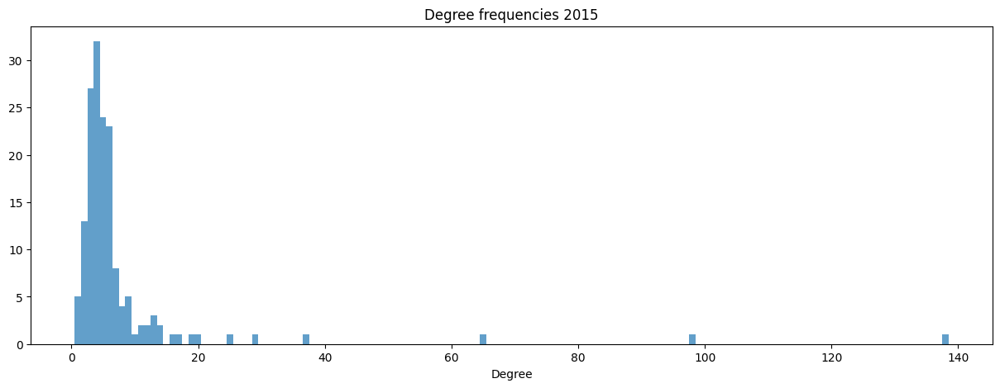

In [10]:
degree = list(dict(G2015bin.degree()).values())
print('Standard deviation: {}'.format(np.std(degree)))
print('Mean: {}'.format(np.mean(degree)))
print('Median: {}'.format(np.median(degree)))
print('Min: {}'.format(np.min(degree)))
print('Max: {}'.format(np.max(degree)))
print("Assortativity coefficient: " + str(nx.degree_assortativity_coefficient(G2015bin)))

plt.figure(figsize=(15,5))
plt.hist(degree, bins=np.arange(min(degree), max(degree) + 2) - 0.5, alpha=0.7)
plt.xlabel('Degree')
plt.title('Degree frequencies 2015')
plt.savefig('DegreeFreq2015')
plt.show()


In [11]:
print(dict(G2015bin.degree()))

{'AGO': 4, 'CHN': 138, 'PRT': 6, 'TGO': 6, 'ALB': 3, 'ITA': 20, 'ARE': 16, 'BWA': 4, 'COG': 3, 'COM': 3, 'LBN': 3, 'USA': 98, 'ZMB': 4, 'ARG': 9, 'BOL': 6, 'BRA': 12, 'ARM': 5, 'RUS': 25, 'ATG': 3, 'AUS': 9, 'FJI': 7, 'NZL': 9, 'AUT': 3, 'BIH': 8, 'DEU': 65, 'AZE': 4, 'TUR': 14, 'BDI': 5, 'IND': 37, 'BEL': 13, 'IRL': 7, 'LSO': 4, 'LUX': 6, 'MWI': 6, 'NLD': 10, 'SLE': 6, 'BEN': 5, 'FRA': 29, 'BFA': 2, 'BGD': 5, 'BTN': 2, 'BGR': 6, 'GEO': 5, 'BHR': 4, 'SAU': 14, 'BHS': 5, 'DMA': 2, 'HRV': 8, 'BLR': 3, 'BMU': 4, 'CAN': 6, 'PRY': 6, 'URY': 5, 'BRB': 5, 'TTO': 6, 'BRN': 8, 'MYS': 6, 'SGP': 13, 'ZAF': 13, 'CAF': 3, 'JAM': 3, 'SUR': 7, 'CHE': 3, 'CHL': 5, 'CMR': 6, 'ERI': 2, 'ETH': 4, 'GAB': 2, 'GHA': 3, 'GMB': 4, 'GNQ': 2, 'HKG': 5, 'IDN': 6, 'IRN': 3, 'JPN': 19, 'KAZ': 9, 'KGZ': 7, 'KOR': 12, 'KWT': 5, 'LAO': 5, 'LBR': 3, 'MAC': 4, 'MLI': 3, 'MNG': 3, 'MOZ': 2, 'MRT': 2, 'NER': 4, 'OMN': 3, 'PAK': 5, 'PER': 4, 'PHL': 6, 'PNG': 2, 'THA': 11, 'TKM': 1, 'TZA': 4, 'UZB': 4, 'VEN': 3, 'VNM': 3, 

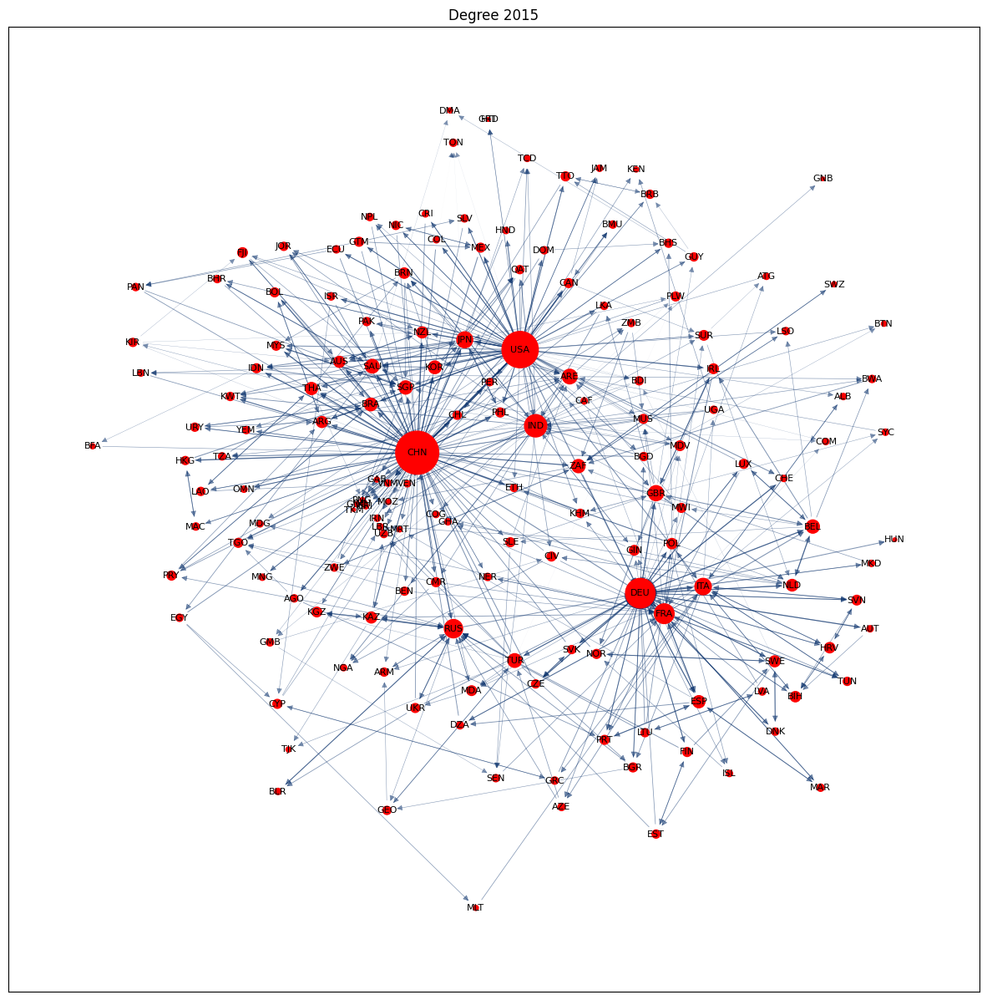

In [12]:
edges = G2015bin.edges(data=True)
edge_colors = [attr['price'] for _, _, attr in edges]
node_size = [v*10 for v in degree]

# draw the graph
pos = nx.kamada_kawai_layout(G2015bin)
plt.figure(figsize=(15,15))
nx.draw_networkx_nodes(G2015bin, pos, node_size=node_size, node_color='red', label=True)
nx.draw_networkx_edges(G2015bin, pos, alpha=0.5, edge_color=edge_colors, edge_cmap=plt.cm.Blues, edge_vmin=min_price, edge_vmax=max_price, width=norm_prices)
nx.draw_networkx_labels(G2015bin, pos, font_size = 8)

plt.title('Degree 2015')

plt.savefig("Degree2015.png")
plt.show()

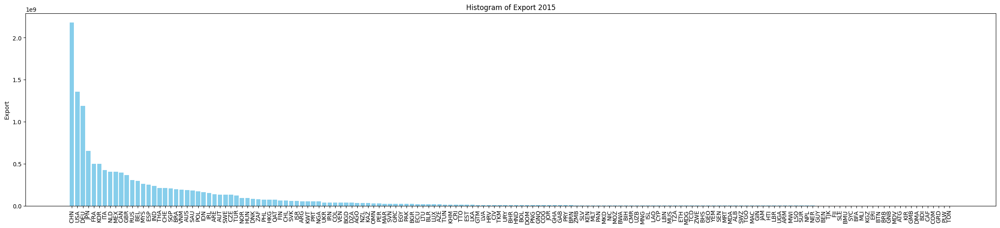

In [13]:
plot = 'Export'
plt.figure(figsize=(30, 6))
plt.bar(df_2015.sort_values(by=plot, ascending=False)['index'], df_2015.sort_values(by=plot, ascending=False)[plot], color='skyblue')
plt.ylabel(plot)
plt.title('Histogram of '+plot+' 2015')
plt.xticks(rotation=90)
plt.savefig(plot+"2015.png")
plt.show()


In [14]:
print(list(nx.isolates(G2015)))

[]


## Clustering

In [15]:
clusters = nx.average_clustering(G2015bin, weight='wheight') #weight='price'
clusters

0.45858920801760283

In [16]:
local_cluster = nx.clustering(G2015bin, weight='weight')
sorted(local_cluster.items(), key=lambda item: item[1], reverse= True)


[('AUT', 1.0),
 ('BFA', 1.0),
 ('BHR', 1.0),
 ('BLR', 1.0),
 ('URY', 1.0),
 ('JAM', 1.0),
 ('GNQ', 1.0),
 ('MAC', 1.0),
 ('MNG', 1.0),
 ('MOZ', 1.0),
 ('PER', 1.0),
 ('PHL', 1.0),
 ('PNG', 1.0),
 ('COL', 1.0),
 ('CRI', 1.0),
 ('DNK', 1.0),
 ('MKD', 1.0),
 ('SVN', 1.0),
 ('MAR', 1.0),
 ('HND', 1.0),
 ('BOL', 0.9230769230769231),
 ('HRV', 0.9166666666666666),
 ('SLV', 0.9),
 ('BRB', 0.875),
 ('NIC', 0.875),
 ('BIH', 0.8),
 ('DOM', 0.8),
 ('KGZ', 0.7777777777777778),
 ('JOR', 0.7777777777777778),
 ('HKG', 0.75),
 ('CZE', 0.75),
 ('SVK', 0.75),
 ('MYS', 0.7307692307692307),
 ('MEX', 0.7307692307692307),
 ('TZA', 0.7),
 ('ARG', 0.6666666666666666),
 ('UZB', 0.6666666666666666),
 ('VEN', 0.6666666666666666),
 ('VNM', 0.6666666666666666),
 ('ISL', 0.6666666666666666),
 ('GUY', 0.6666666666666666),
 ('QAT', 0.65),
 ('CHL', 0.625),
 ('LAO', 0.625),
 ('PRT', 0.6153846153846154),
 ('LUX', 0.6153846153846154),
 ('KWT', 0.6111111111111112),
 ('EST', 0.6111111111111112),
 ('IDN', 0.6071428571428571)

## Centrality

In [17]:
import statistics
deg_centr = nx.degree_centrality(G2015bin)
sort_orders = sorted(deg_centr.items(), key=lambda x: x[1], reverse=True)
avg_degree_centrality = sum(deg_centr.values()) / len(deg_centr)
print('average of degree centrality: {}'.format(avg_degree_centrality))

degree_centrality_values = list(deg_centr.values())
median_degree_centrality = statistics.median(degree_centrality_values)
print('median of degree centrality: {}'.format(median_degree_centrality))
print('min of degree centrality: {}'.format(sort_orders[-1]))
print('max of degree centrality: {}'.format(sort_orders[0]))

print("10 most important nodes for Degree Centrality:")
for i in range(10):
  print(sort_orders[i])

average of degree centrality: 0.047282608695652185
median of degree centrality: 0.03125
min of degree centrality: ('HTI', 0.00625)
max of degree centrality: ('CHN', 0.8625)
10 most important nodes for Degree Centrality:
('CHN', 0.8625)
('USA', 0.6125)
('DEU', 0.40625)
('IND', 0.23125)
('FRA', 0.18125000000000002)
('RUS', 0.15625)
('ITA', 0.125)
('JPN', 0.11875000000000001)
('GBR', 0.10625000000000001)
('ARE', 0.1)


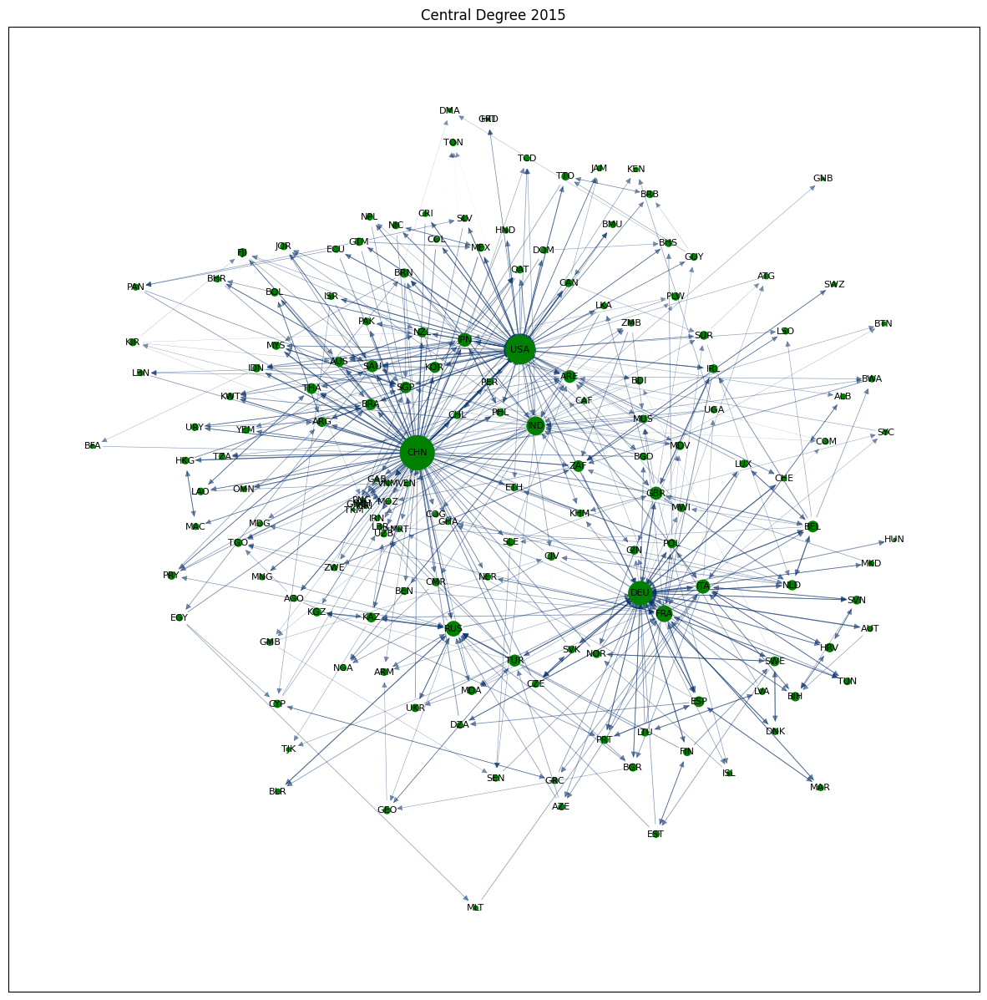

In [18]:
edges = G2015bin.edges(data=True)
edge_colors = [attr['price'] for _, _, attr in edges]
node_size = [deg_centr[i]*1000 for i in deg_centr]

# draw the graph
pos = nx.kamada_kawai_layout(G2015bin)
plt.figure(figsize=(15,15))
nx.draw_networkx_nodes(G2015bin, pos, node_size=node_size, node_color='green', label=True)
nx.draw_networkx_edges(G2015bin, pos, alpha=0.5, edge_color=edge_colors, edge_cmap=plt.cm.Blues, edge_vmin=min_price, edge_vmax=max_price, width=norm_prices)
nx.draw_networkx_labels(G2015bin, pos, font_size = 8)

plt.title('Central Degree 2015')

plt.savefig("CentralDegree2015.png")
plt.show()

## Betweeness

In [19]:
betweenesCentrality = nx.betweenness_centrality(G2015bin, weight='weight')
sort_orders = sorted(betweenesCentrality.items(), key=lambda x: x[1], reverse=True)

avg_degree_betweenesCentrality = sum(betweenesCentrality.values()) / len(betweenesCentrality)
print('average of bewteenness centrality: {}'.format(avg_degree_betweenesCentrality))
print("10 most important nodes for Betweennes Centrality:")
print('max of betweenes centrality: {}'.format(sort_orders[0]))
for i in range(10):
  print(sort_orders[i])

average of bewteenness centrality: 0.009026963943904062
10 most important nodes for Betweennes Centrality:
max of betweenes centrality: ('CHN', 0.4331671907147012)
('CHN', 0.4331671907147012)
('USA', 0.30044618531799616)
('DEU', 0.20825282735692488)
('RUS', 0.049494314393262226)
('FRA', 0.04573297277154921)
('ZAF', 0.039020401348321264)
('ITA', 0.0357169560430329)
('IND', 0.0337326366527428)
('SAU', 0.025997072694096377)
('GBR', 0.017990387016099684)


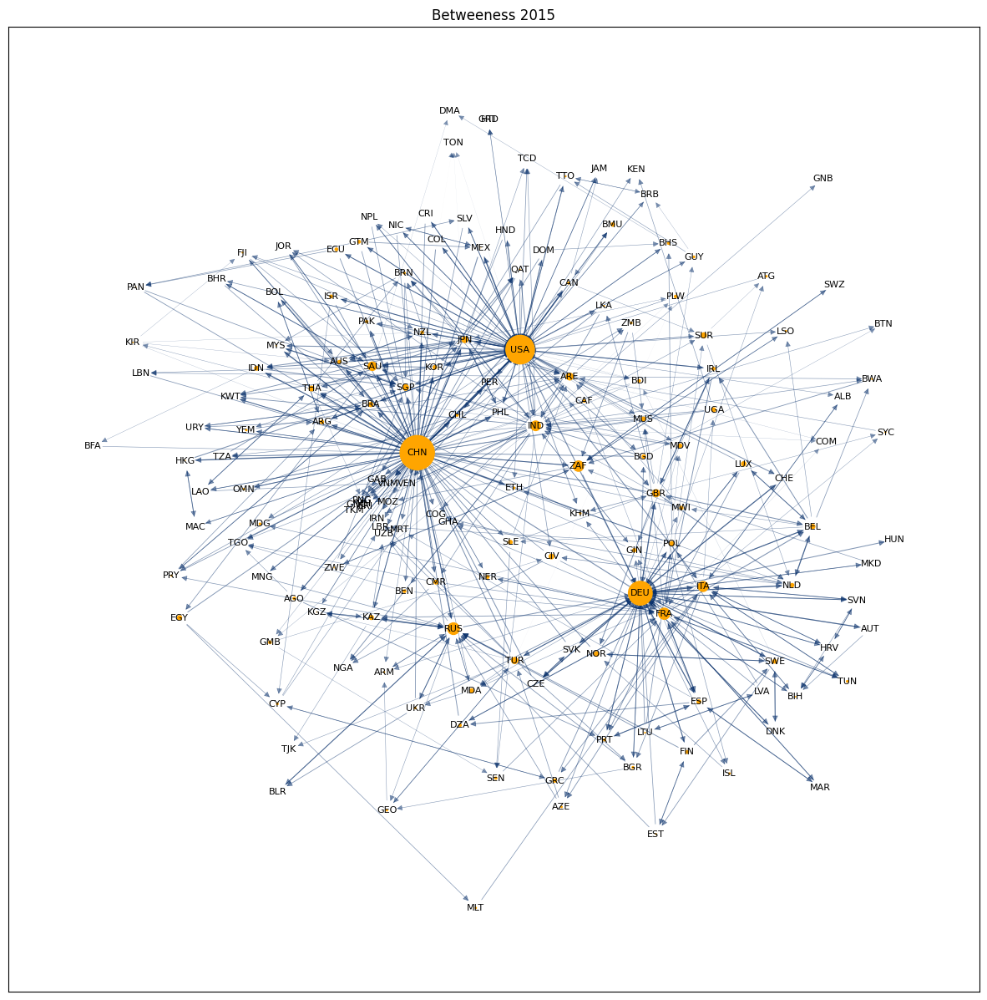

In [20]:
edges = G2015bin.edges(data=True)
edge_colors = [attr['price'] for _, _, attr in edges]
node_size = [betweenesCentrality[i]*2015 for i in betweenesCentrality]

# draw the graph
pos = nx.kamada_kawai_layout(G2015bin)
plt.figure(figsize=(15,15))
nx.draw_networkx_nodes(G2015bin, pos, node_size=node_size, node_color='orange', label=True)
nx.draw_networkx_edges(G2015bin, pos, alpha=0.5, edge_color=edge_colors, edge_cmap=plt.cm.Blues, edge_vmin=min_price, edge_vmax=max_price, width=norm_prices)
nx.draw_networkx_labels(G2015bin, pos, font_size = 8)
plt.title('Betweeness 2015')

plt.savefig("betweeness2015.png")
plt.show()

## Eigenvector

In [21]:
eigen = nx.eigenvector_centrality(G2015bin, weight='weight')
sort_orders = sorted(eigen.items(), key=lambda x: x[1], reverse=True)

avg_degree_eignCentrality = sum(eigen.values()) / len(eigen)
print('average of eignvector centrality: {}'.format(avg_degree_eignCentrality))
print('max of eigenvector centrality: {}'.format(sort_orders[0]))
print("10 most important nodes for Eigenvector Centrality:")
for i in range(10):
  print(sort_orders[i])

average of eignvector centrality: 0.05520543334642969
max of eigenvector centrality: ('CHN', 0.5724124589219326)
10 most important nodes for Eigenvector Centrality:
('CHN', 0.5724124589219326)
('USA', 0.3086553462119216)
('SAU', 0.1350023263317481)
('JPN', 0.1347824949353622)
('DEU', 0.13095931823072446)
('SGP', 0.12482741239512778)
('BRA', 0.12195393585198293)
('RUS', 0.11639349866269112)
('MYS', 0.11563519506672426)
('NZL', 0.11390212166935995)


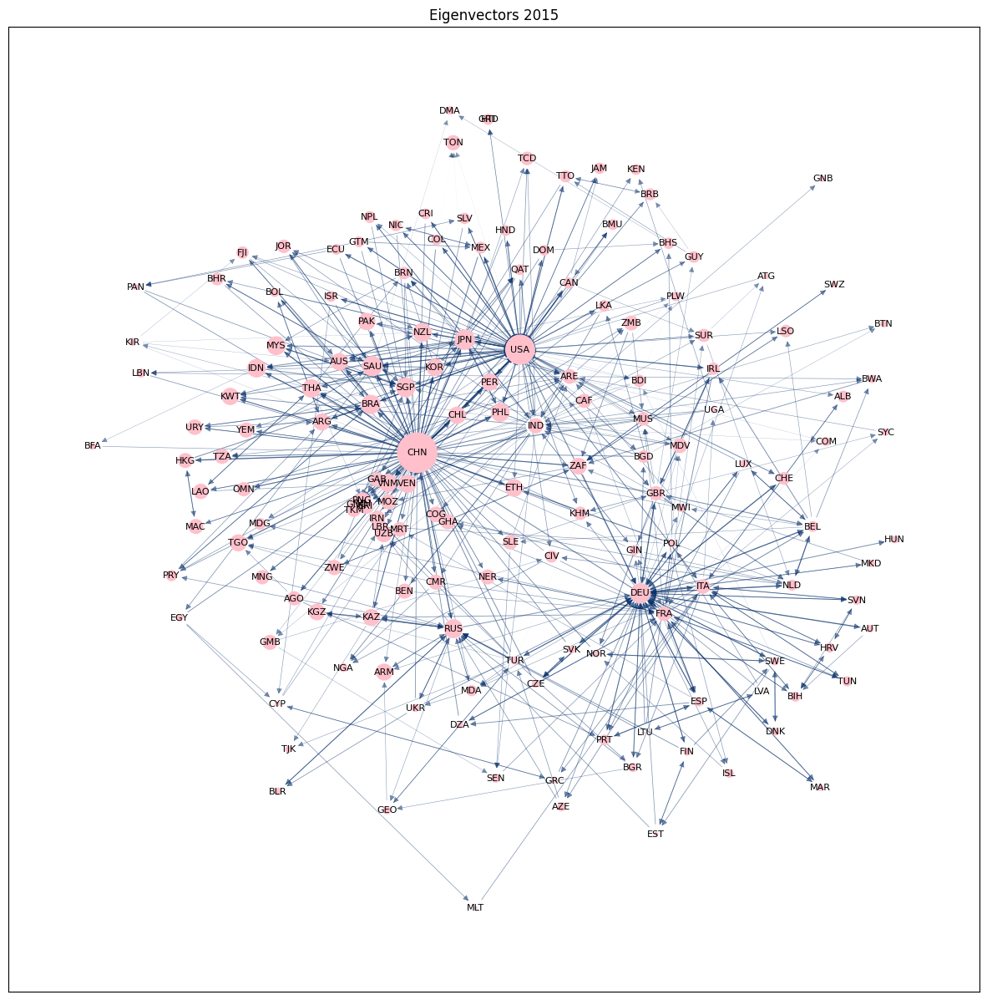

In [22]:
edges = G2015bin.edges(data=True)
edge_colors = [attr['price'] for _, _, attr in edges]
node_size = [eigen[i]*2015 for i in eigen]

# draw the graph
pos = nx.kamada_kawai_layout(G2015bin)
plt.figure(figsize=(15,15))
nx.draw_networkx_nodes(G2015bin, pos, node_size=node_size, node_color='pink', label=True)
nx.draw_networkx_edges(G2015bin, pos, alpha=0.5, edge_color=edge_colors, edge_cmap=plt.cm.Blues, edge_vmin=min_price, edge_vmax=max_price, width=norm_prices)
nx.draw_networkx_labels(G2015bin, pos, font_size = 8)
plt.title('Eigenvectors 2015')

plt.savefig("Eigenvector2015.png")
plt.show()

## Pagerank

In [23]:
pagerank = nx.pagerank(G2015bin, alpha=0.85, weight='weight')
sort_orders = sorted(pagerank.items(), key=lambda x: x[1], reverse=True)


avg_degree_pagerank = sum(pagerank.values()) / len(pagerank)
print('average of pagerank : {}'.format(avg_degree_pagerank))
print('max of pagerank: {}'.format(sort_orders[0]))
print("10 most important nodes for Page Rank:")
for i in range(10):
  print(sort_orders[i])

average of pagerank : 0.006211180124223602
max of pagerank: ('CHN', 0.12314991267741544)
10 most important nodes for Page Rank:
('CHN', 0.12314991267741544)
('USA', 0.05231512367661084)
('DEU', 0.038460218864607175)
('RUS', 0.028195688958302313)
('ZAF', 0.021114763489328708)
('FRA', 0.020059201383278193)
('SGP', 0.01833385101428721)
('ITA', 0.01433894971874099)
('IND', 0.014015632031546172)
('ARE', 0.012186673609977789)


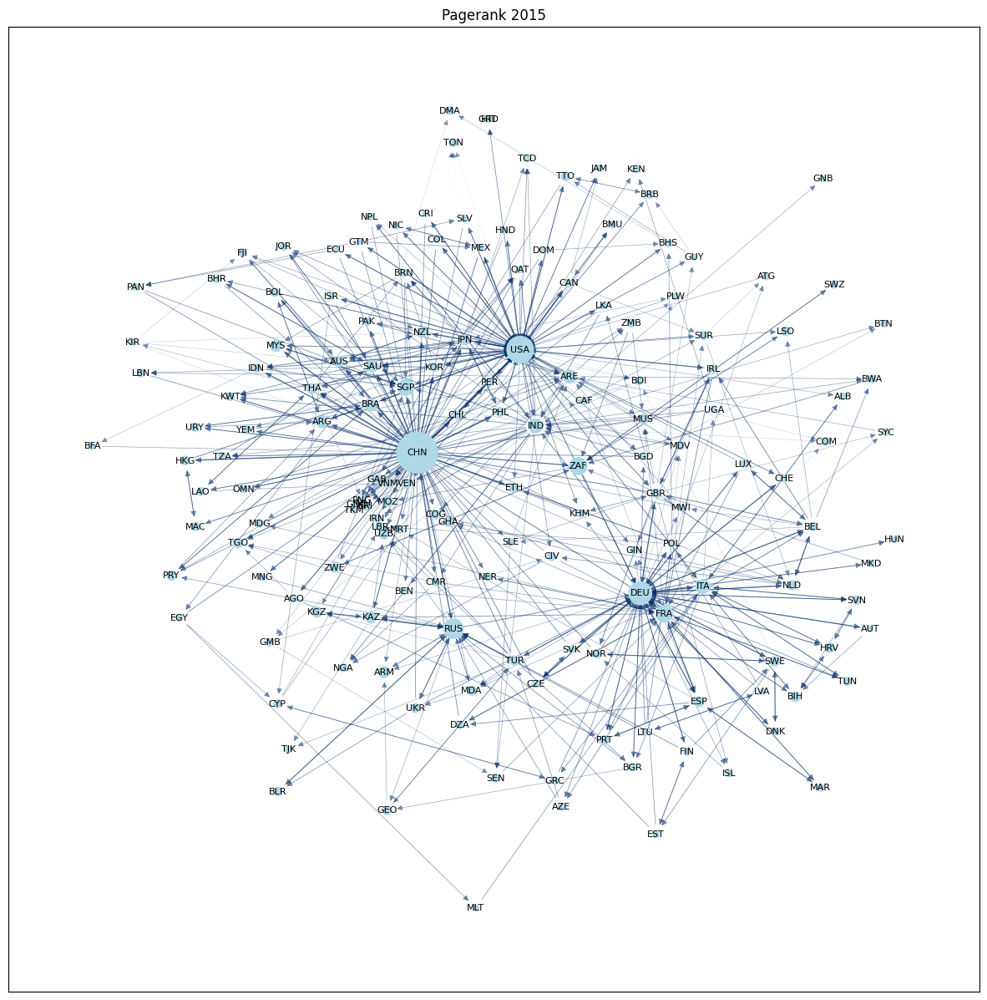

In [24]:
edges = G2015bin.edges(data=True)
edge_colors = [attr['price'] for _, _, attr in edges]
node_size = [pagerank[i]*10000 for i in pagerank]

# draw the graph
pos = nx.kamada_kawai_layout(G2015bin)
plt.figure(figsize=(15,15))
nx.draw_networkx_nodes(G2015bin, pos, node_size=node_size, node_color='lightblue', label=True)
nx.draw_networkx_edges(G2015bin, pos, alpha=0.5, edge_color=edge_colors, edge_cmap=plt.cm.Blues, edge_vmin=min_price, edge_vmax=max_price, width=norm_prices)
nx.draw_networkx_labels(G2015bin, pos, font_size = 8)
plt.title('Pagerank 2015')

plt.savefig("Pagerank2015.png")
plt.show()

## Closeness

In [25]:
closeness = nx.closeness_centrality(G2015bin)
sort_orders = sorted(closeness.items(), key=lambda x: x[1], reverse=True)

avg_degree_closeness = sum(closeness.values()) / len(closeness)
print('average of closeness : {}'.format(avg_degree_closeness))

print("10 most important nodes for closeness_centrality:")
for i in range(10):
  print(sort_orders[i])

average of closeness : 0.3063146744821287
10 most important nodes for closeness_centrality:
('CHN', 0.581875)
('USA', 0.4219704198473283)
('DEU', 0.40946759259259263)
('ARM', 0.38387586805555557)
('RUS', 0.37861729452054793)
('KAZ', 0.367296511627907)
('SAU', 0.36608029801324504)
('GHA', 0.3643668831168831)
('VEN', 0.3643668831168831)
('BRA', 0.36367187500000003)


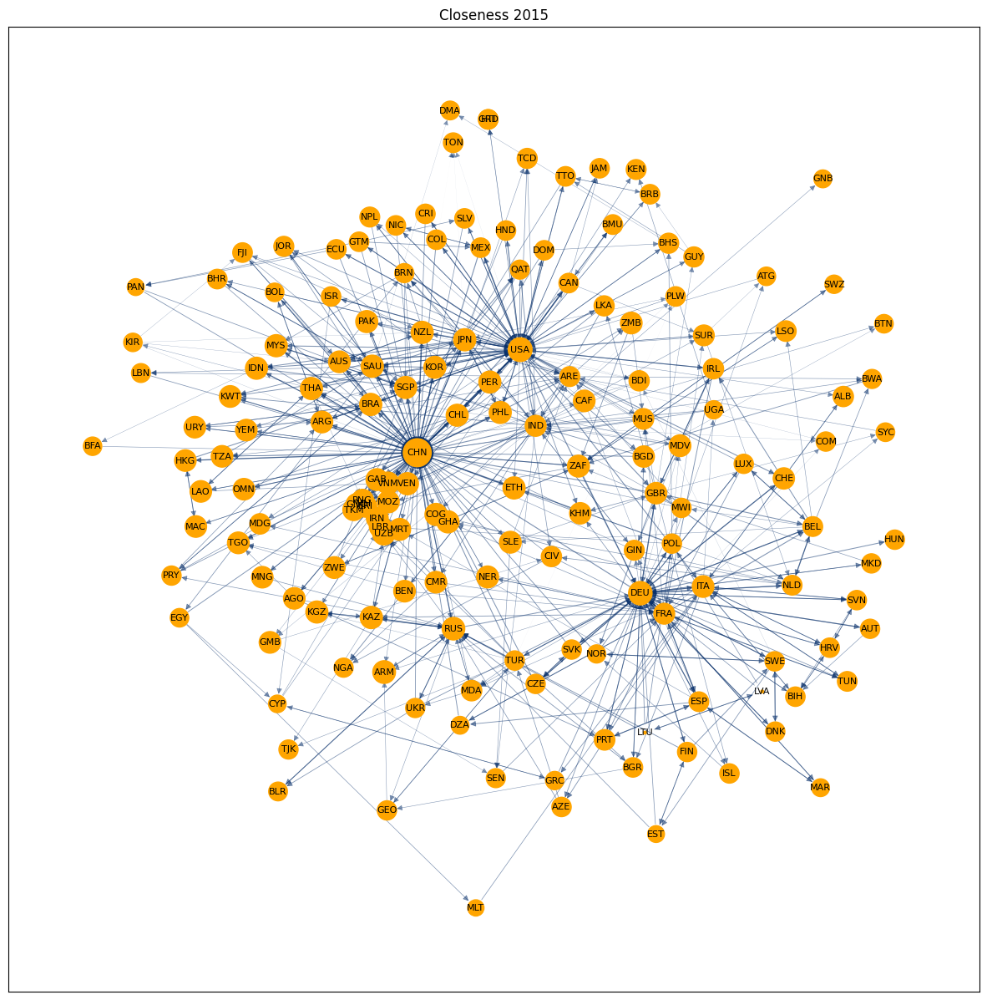

In [26]:
edges = G2015bin.edges(data=True)
edge_colors = [attr['price'] for _, _, attr in edges]
node_size = [closeness[i]*1000 for i in closeness]

# draw the graph
pos = nx.kamada_kawai_layout(G2015bin)
plt.figure(figsize=(15,15))
nx.draw_networkx_nodes(G2015bin, pos, node_size=node_size, node_color='orange', label=True)
nx.draw_networkx_edges(G2015bin, pos, alpha=0.5, edge_color=edge_colors, edge_cmap=plt.cm.Blues, edge_vmin=min_price, edge_vmax=max_price, width=norm_prices)
nx.draw_networkx_labels(G2015bin, pos, font_size = 8)
plt.title('Closeness 2015')

plt.savefig("closeness2015.png")
plt.show()

## Communities

In [27]:
import networkx.algorithms.community as nx_comm
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import networkx as nx

list_community_sets_greedy = list(nx_comm.greedy_modularity_communities(G2015bin,weight='weight'))
print(list_community_sets_greedy[0:20])

[frozenset({'VNM', 'PNG', 'BOL', 'BRN', 'YEM', 'BEN', 'LAO', 'BDI', 'IDN', 'CHL', 'HKG', 'AUS', 'PAK', 'NZL', 'MAC', 'GNQ', 'BFA', 'MLI', 'FJI', 'CMR', 'GAB', 'AGO', 'TKM', 'MNG', 'BRA', 'OMN', 'ETH', 'THA', 'SGP', 'ARG', 'KIR', 'PRY', 'TGO', 'MYS', 'URY', 'CHN'}), frozenset({'GRD', 'TON', 'PHL', 'SLV', 'QAT', 'GUY', 'JPN', 'KOR', 'DOM', 'PER', 'TCD', 'ECU', 'CRI', 'ATG', 'HND', 'TTO', 'NIC', 'HTI', 'USA', 'SUR', 'CAN', 'COL', 'MEX', 'GTM', 'ISR', 'KWT', 'BHS', 'PLW', 'BRB', 'PAN', 'BMU', 'JAM'}), frozenset({'DNK', 'IRL', 'ITA', 'GBR', 'TUN', 'MWI', 'SLE', 'SWE', 'CZE', 'BGR', 'EST', 'BEL', 'FIN', 'SVK', 'ISL', 'MKD', 'NLD', 'SVN', 'HUN', 'AUT', 'NOR', 'LUX', 'HRV', 'ALB', 'BIH', 'KHM', 'CHE', 'DEU'}), frozenset({'BHR', 'CIV', 'KEN', 'GMB', 'NPL', 'LKA', 'GNB', 'NGA', 'UGA', 'SEN', 'TZA', 'VEN', 'ERI', 'BGD', 'IND', 'JOR', 'SAU', 'BTN', 'DMA', 'GIN'}), frozenset({'PRT', 'LBN', 'MDG', 'CAF', 'ARE', 'SYC', 'MRT', 'MDV', 'FRA', 'COM', 'NER', 'ESP', 'COG', 'GHA', 'MUS', 'ZMB', 'MAR', 'DZA'

In [28]:
partition_greedy = {}
for i, comm in enumerate(list_community_sets_greedy):
    print("Community:", i)
    print("Number of elems",len(comm))
    for n in comm:
        partition_greedy[n]=i

Community: 0
Number of elems 36
Community: 1
Number of elems 32
Community: 2
Number of elems 28
Community: 3
Number of elems 20
Community: 4
Number of elems 18
Community: 5
Number of elems 13
Community: 6
Number of elems 8
Community: 7
Number of elems 6


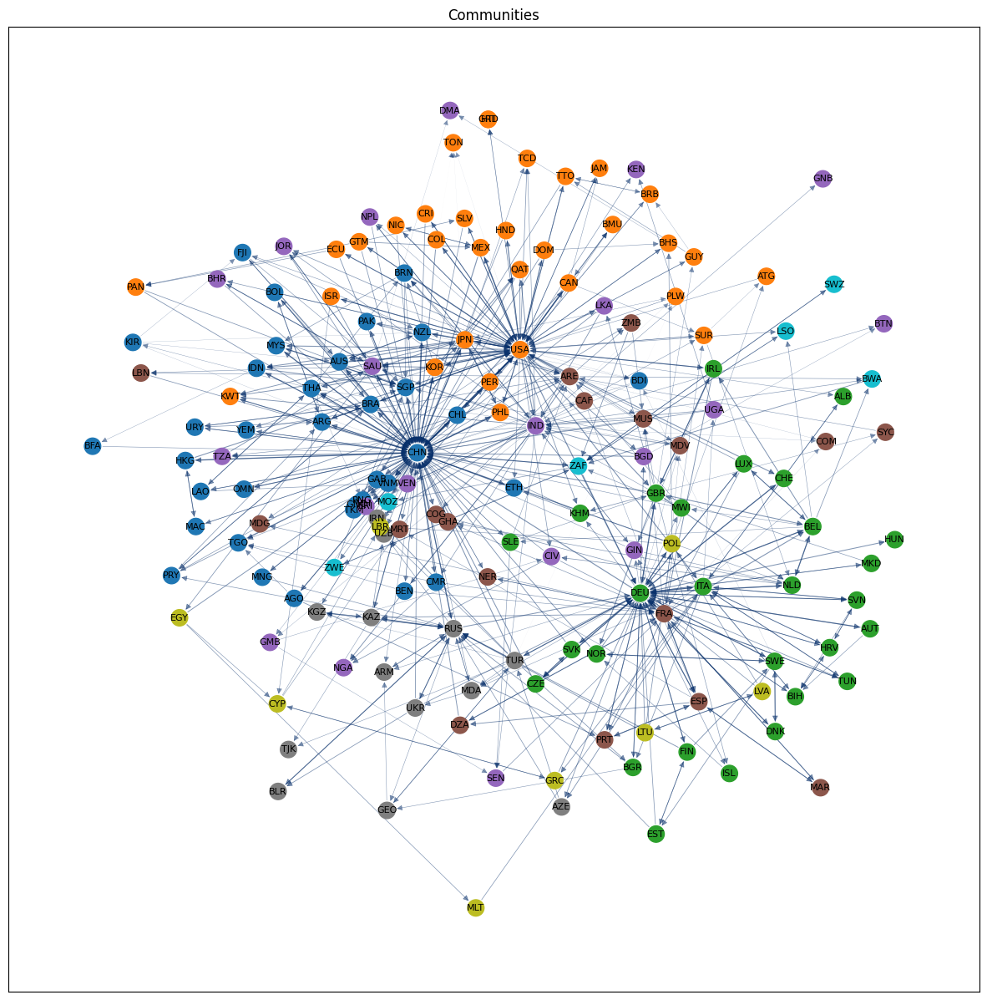

In [29]:
# draw the graph
pos = nx.kamada_kawai_layout(G2015bin)
# color the nodes according to their partition
cmap = cm.get_cmap('tab10', max(partition_greedy.values()) + 1)
plt.figure(figsize=(15,15))

nx.draw_networkx_nodes(G2015bin, pos, partition_greedy.keys(), node_size=200,
                       cmap=cmap, node_color=list(partition_greedy.values()))
nx.draw_networkx_edges(G2015bin, pos, alpha=0.5, edge_color=edge_colors, edge_cmap=plt.cm.Blues, edge_vmin=min_price, edge_vmax=max_price, width=norm_prices)
nx.draw_networkx_labels(G2015bin, pos, font_size = 8)
plt.title('Communities')
plt.savefig('Commmunity.png')


plt.show()

# Analysis on original graph

## Density

In [30]:
density = nx.density(G2015)
print('Density 2015: {}'.format(density))

Density 2015: 0.7011257763975155


## Degree

In [31]:
degree = list(dict(G2015.degree()).values())
print('Standard deviation: {}'.format(np.std(degree)))
print('Mean: {}'.format(np.mean(degree)))
print('Median: {}'.format(np.median(degree)))
print('Min: {}'.format(np.min(degree)))
print('Max: {}'.format(np.max(degree)))
print("Assortativity coefficient: " + str(nx.degree_assortativity_coefficient(G2015)))

Standard deviation: 69.19847705887368
Mean: 224.36024844720498
Median: 250.0
Min: 47
Max: 293
Assortativity coefficient: -0.1855935592516797


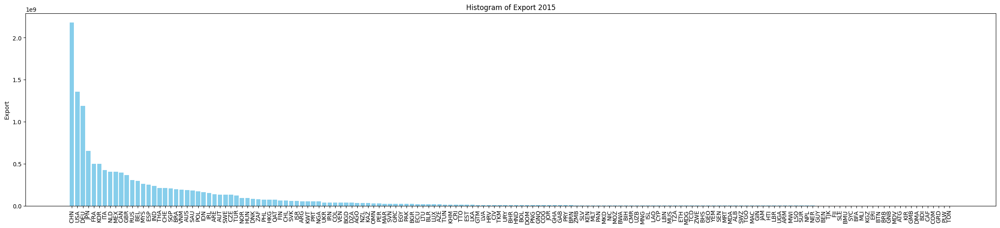

In [32]:
plot = 'Export'
plt.figure(figsize=(30, 6))
plt.bar(df_2015.sort_values(by=plot, ascending=False)['index'], df_2015.sort_values(by=plot, ascending=False)[plot], color='skyblue')
plt.ylabel(plot)
plt.title('Histogram of '+plot+' 2015')
plt.xticks(rotation=90)
plt.savefig(plot+"2015.png")
plt.show()


In [33]:
print(list(nx.isolates(G2015)))

[]


## Clustering

In [34]:
clusters = nx.average_clustering(G2015) #weight='price'
clusters

0.8508999579832044

In [35]:
local_cluster = nx.clustering(G2015, weight='price')
sorted(local_cluster.items(), key=lambda item: item[1], reverse= True)


[('CHN', 0.00283942838741127),
 ('USA', 0.0027576849860776894),
 ('DEU', 0.0022358761775484316),
 ('JPN', 0.001391030296042344),
 ('FRA', 0.001380227619131446),
 ('GBR', 0.0013066681041398415),
 ('ITA', 0.0012263703157093595),
 ('KOR', 0.0011232230668250496),
 ('NLD', 0.0010901287265248807),
 ('BEL', 0.0009855718596660562),
 ('IND', 0.0009326710529488577),
 ('ESP', 0.0009144815654811604),
 ('VNM', 0.0008641383367940711),
 ('RUS', 0.0008203572559439758),
 ('CAN', 0.0007399044274290249),
 ('MEX', 0.0006991922882402971),
 ('BRA', 0.0006854834199696354),
 ('SGP', 0.0006813160954546826),
 ('CHE', 0.0006696605010301628),
 ('THA', 0.000658475366719162),
 ('MYS', 0.0006489184686047924),
 ('TUR', 0.0006296094857858669),
 ('POL', 0.000613660502938132),
 ('SAU', 0.0006116069593039498),
 ('HKG', 0.000574292279211936),
 ('AUS', 0.0005589329663561721),
 ('ARE', 0.00054783794023336),
 ('IDN', 0.0005446336384925764),
 ('SWE', 0.0005302794907735878),
 ('AUT', 0.0005099593936150255),
 ('HUN', 0.00049306

## Centrality

In [36]:
import statistics
deg_centr = nx.degree_centrality(G2015)
sort_orders = sorted(deg_centr.items(), key=lambda x: x[1], reverse=True)
avg_degree_centrality = sum(deg_centr.values()) / len(deg_centr)
print('average of degree centrality: {}'.format(avg_degree_centrality))

degree_centrality_values = list(deg_centr.values())
median_degree_centrality = statistics.median(degree_centrality_values)
print('median of degree centrality: {}'.format(median_degree_centrality))
print('min of degree centrality: {}'.format(sort_orders[-1]))
print('max of degree centrality: {}'.format(sort_orders[0]))

print("10 most important nodes for Degree Centrality:")
for i in range(10):
  print(sort_orders[i])

average of degree centrality: 1.4022515527950312
median of degree centrality: 1.5625
min of degree centrality: ('TON', 0.29375)
max of degree centrality: ('CHN', 1.83125)
10 most important nodes for Degree Centrality:
('CHN', 1.83125)
('FRA', 1.83125)
('GBR', 1.83125)
('JPN', 1.83125)
('KOR', 1.83125)
('NLD', 1.83125)
('SGP', 1.83125)
('USA', 1.83125)
('CAN', 1.8250000000000002)
('CHE', 1.8250000000000002)


## Betweeness

In [37]:
betweenesCentrality = nx.betweenness_centrality(G2015, weight='price')
sort_orders = sorted(betweenesCentrality.items(), key=lambda x: x[1], reverse=True)

avg_degree_betweenesCentrality = sum(betweenesCentrality.values()) / len(betweenesCentrality)
print('average of bewteenness centrality: {}'.format(avg_degree_betweenesCentrality))
print("10 most important nodes for Betweennes Centrality:")
print('max of betweenes centrality: {}'.format(sort_orders[0]))
for i in range(10):
  print(sort_orders[i])

average of bewteenness centrality: 0.02025665065041602
10 most important nodes for Betweennes Centrality:
max of betweenes centrality: ('BWA', 0.2337067610062893)
('BWA', 0.2337067610062893)
('PLW', 0.2282822327044025)
('PER', 0.21931996855345912)
('MWI', 0.16552672955974843)
('ATG', 0.13771619496855345)
('MDG', 0.12836084905660378)
('BMU', 0.11647012578616352)
('KGZ', 0.09858490566037735)
('BDI', 0.09675707547169811)
('SWZ', 0.09229559748427672)


## Eigenvector

In [38]:
eigen = nx.eigenvector_centrality(G2015, weight='price')
sort_orders = sorted(eigen.items(), key=lambda x: x[1], reverse=True)

avg_degree_eignCentrality = sum(eigen.values()) / len(eigen)
print('average of eignvector centrality: {}'.format(avg_degree_eignCentrality))
print('max of eigenvector centrality: {}'.format(sort_orders[0]))
print("10 most important nodes for Eigenvector Centrality:")
for i in range(10):
  print(sort_orders[i])

average of eignvector centrality: 0.02802515532737064
max of eigenvector centrality: ('CHN', 0.608688911927041)
10 most important nodes for Eigenvector Centrality:
('CHN', 0.608688911927041)
('USA', 0.4110361930008748)
('DEU', 0.2857163509669728)
('JPN', 0.2854239612854247)
('KOR', 0.24796019433277333)
('CAN', 0.22510020518699822)
('MEX', 0.22054892506795998)
('FRA', 0.12827304601036646)
('ITA', 0.10466190481181195)
('GBR', 0.10392314756164317)


## Pagerank

In [39]:
pagerank = nx.pagerank(G2015, alpha=0.85, weight='price')
sort_orders = sorted(pagerank.items(), key=lambda x: x[1], reverse=True)


avg_degree_pagerank = sum(pagerank.values()) / len(pagerank)
print('average of pagerank : {}'.format(avg_degree_pagerank))
print('max of pagerank: {}'.format(sort_orders[0]))
print("10 most important nodes for Page Rank:")
for i in range(10):
  print(sort_orders[i])

average of pagerank : 0.006211180124223602
max of pagerank: ('CHN', 0.10802803824440935)
10 most important nodes for Page Rank:
('CHN', 0.10802803824440935)
('USA', 0.07951104929751315)
('DEU', 0.0658385685701162)
('JPN', 0.03792197128219811)
('KOR', 0.030090848207481934)
('FRA', 0.02990979908994324)
('ITA', 0.025387691304456363)
('NLD', 0.022973970125814282)
('GBR', 0.02248713420036469)
('RUS', 0.021414449375211267)


## Closeness

In [40]:
closeness = nx.closeness_centrality(G2015)
sort_orders = sorted(closeness.items(), key=lambda x: x[1], reverse=True)

avg_degree_closeness = sum(closeness.values()) / len(closeness)
print('average of closeness : {}'.format(avg_degree_closeness))

print("10 most important nodes for closeness_centrality:")
for i in range(10):
  print(sort_orders[i])

average of closeness : 0.7313044864335349
10 most important nodes for closeness_centrality:
('VNM', 0.8375)
('AUS', 0.83125)
('BEL', 0.83125)
('BRA', 0.83125)
('CAN', 0.83125)
('CHE', 0.83125)
('CHN', 0.83125)
('DEU', 0.83125)
('DNK', 0.83125)
('ESP', 0.83125)


## Communities

In [41]:
import networkx.algorithms.community as nx_comm
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import networkx as nx

list_community_sets_greedy = list(nx_comm.greedy_modularity_communities(G2015,weight='price'))
print(list_community_sets_greedy[0:20])

[frozenset({'TON', 'IRN', 'VNM', 'BHR', 'BOL', 'MDG', 'BRN', 'NPL', 'NGA', 'JPN', 'BEN', 'LAO', 'UGA', 'BDI', 'HKG', 'MUS', 'ERI', 'MOZ', 'BGD', 'PAK', 'ZMB', 'NZL', 'GNQ', 'MLI', 'CMR', 'KEN', 'GAB', 'AGO', 'TKM', 'KWT', 'MDV', 'OMN', 'COM', 'ETH', 'TZA', 'THA', 'TGO', 'SAU', 'PAN', 'FJI', 'PNG', 'PHL', 'ARE', 'SYC', 'ZWE', 'QAT', 'YEM', 'GNB', 'LKA', 'KOR', 'COG', 'CHL', 'IDN', 'SWZ', 'AUS', 'IND', 'JOR', 'KHM', 'BTN', 'MAC', 'MRT', 'MWI', 'MNG', 'BWA', 'BRA', 'ZAF', 'ARG', 'SGP', 'KIR', 'LSO', 'PRY', 'URY', 'MYS', 'CHN'}), frozenset({'PRT', 'DZA', 'TJK', 'GBR', 'CAF', 'BLR', 'ARM', 'AZE', 'LVA', 'LBR', 'SLE', 'SWE', 'CZE', 'FRA', 'EST', 'LTU', 'GEO', 'NER', 'GHA', 'MKD', 'NLD', 'AUT', 'LUX', 'BIH', 'EGY', 'DEU', 'GRC', 'CIV', 'RUS', 'CYP', 'BFA', 'DNK', 'IRL', 'ITA', 'LBN', 'UKR', 'GMB', 'TUN', 'BGR', 'FIN', 'BEL', 'ESP', 'SVK', 'SEN', 'ISL', 'MLT', 'POL', 'SVN', 'KAZ', 'NOR', 'HRV', 'KGZ', 'HUN', 'ALB', 'MAR', 'UZB', 'CHE', 'MDA', 'GIN', 'TUR'}), frozenset({'USA', 'SUR', 'CAN', 'SL

In [42]:
partition_greedy = {}
for i, comm in enumerate(list_community_sets_greedy):
    print("Community:", i)
    print("Number of elems",len(comm))
    for n in comm:
        partition_greedy[n]=i

Community: 0
Number of elems 74
Community: 1
Number of elems 60
Community: 2
Number of elems 27


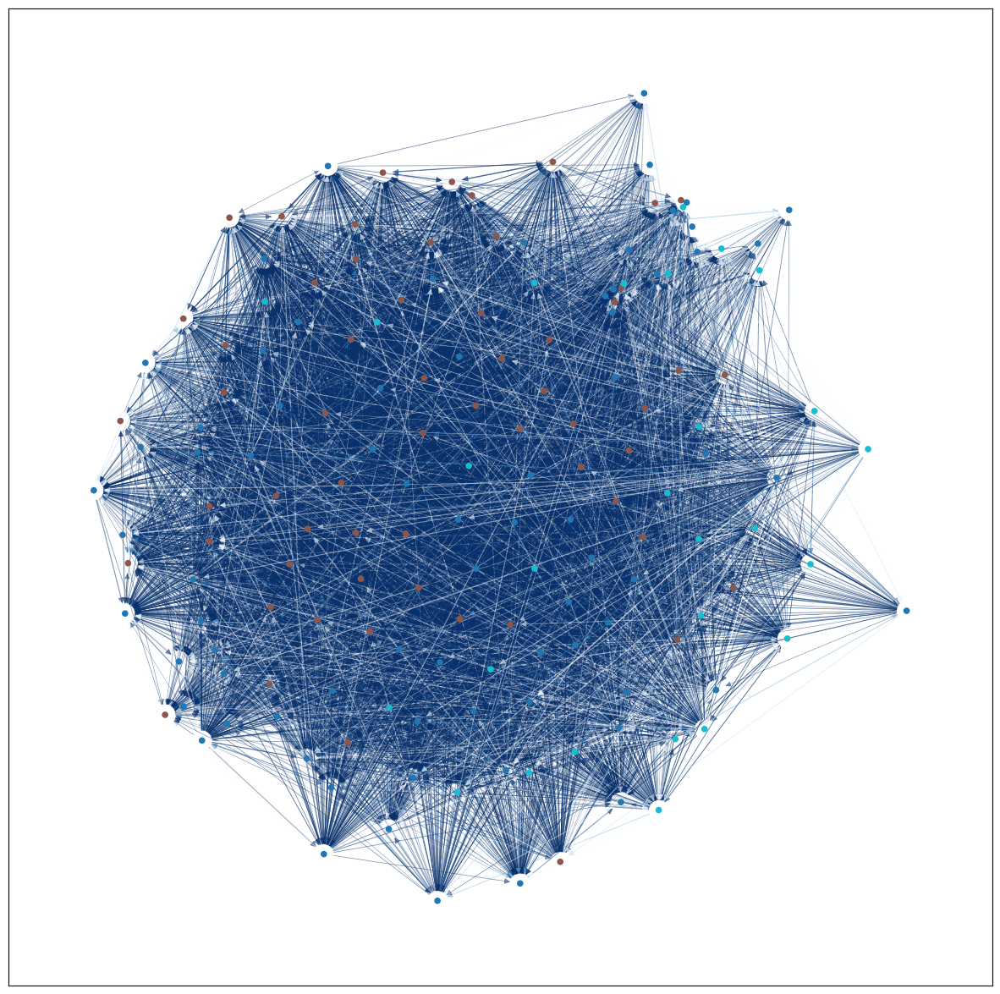

In [43]:
edges = G2015.edges(data=True)
edge_colors = [attr['price'] for _, _, attr in edges]
# draw the graph
pos = nx.kamada_kawai_layout(G2015)
# color the nodes according to their partition
cmap = cm.get_cmap('tab10', max(partition_greedy.values()) + 1)
plt.figure(figsize=(15,15))

nx.draw_networkx_nodes(G2015, pos, partition_greedy.keys(), node_size=20,
                       cmap=cmap, node_color=list(partition_greedy.values()))
nx.draw_networkx_edges(G2015, pos, alpha=0.5, edge_color=edge_colors, edge_cmap=plt.cm.Blues, edge_vmin=min_price, edge_vmax=max_price, width=norm_prices)


plt.show()

## Data correlations

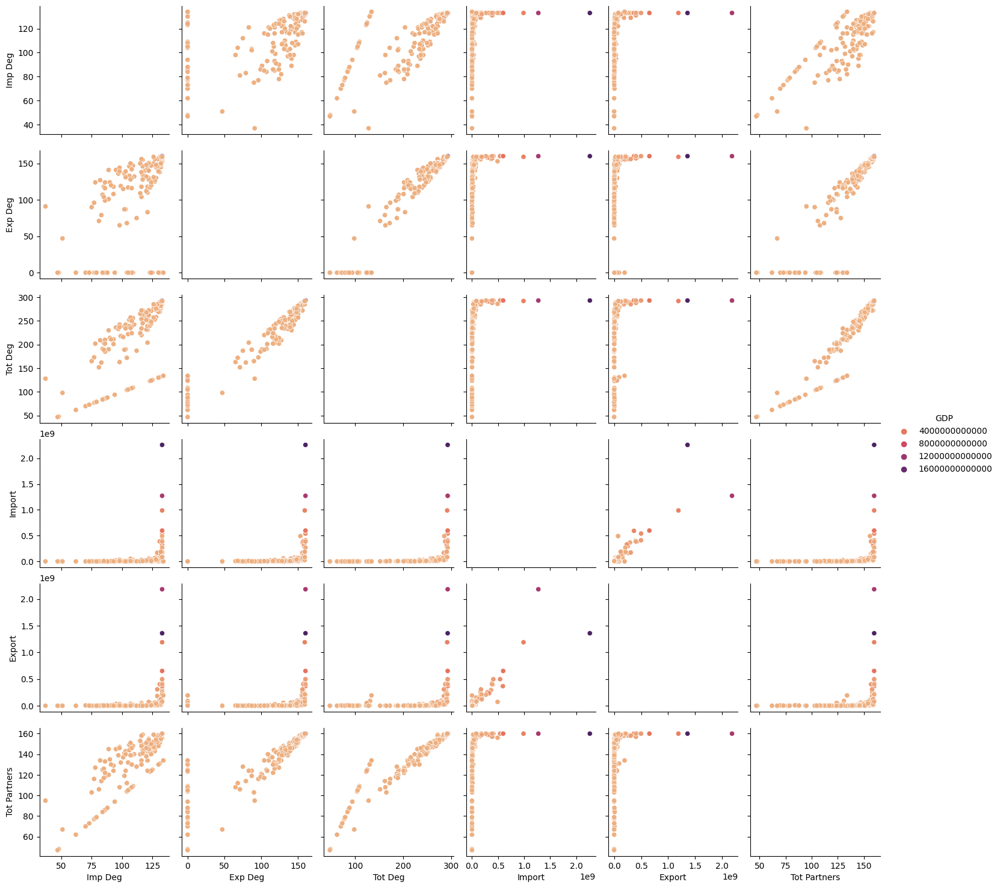

In [44]:
sns.pairplot(df_2015, hue = 'GDP'
             , diag_kind='auto',
             palette='flare'
            )